In [1]:
import sys, os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from my_models import unify_yelp_data_classes, plot_classes_distribution
FOLDER_PATH = '/home/vahidsanei_google_com/data/yelp_data'

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
%load_ext autoreload
%autoreload 2

In [3]:
df = pd.read_csv(os.path.join(FOLDER_PATH, 'updated_large', 'business_with_corpus.csv'))

In [4]:
df = unify_yelp_data_classes(df)

/home/vahidsanei_google_com/advertiser-quality-from-sites/source/my_models.py:437: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['categories'] = df['categories'].apply(lambda x: re.split('[,;&]', x))
/home/vahidsanei_google_com/advertiser-quality-from-sites/source/my_models.py:456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['categories'] = cat


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67945 entries, 0 to 78567
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      67945 non-null  int64  
 1   business_id     67945 non-null  object 
 2   name            67945 non-null  object 
 3   address         65177 non-null  object 
 4   city            67945 non-null  object 
 5   state           67945 non-null  object 
 6   postal_code     67813 non-null  object 
 7   latitude        67945 non-null  float64
 8   longitude       67945 non-null  float64
 9   stars           67945 non-null  float64
 10  review_count    67945 non-null  int64  
 11  is_open         67945 non-null  int64  
 12  attributes      59391 non-null  object 
 13  categories      67945 non-null  object 
 14  hours           59100 non-null  object 
 15  url             67945 non-null  object 
 16  webpage_text    67945 non-null  object 
 17  is_eng          67945 non-null 

In [6]:
df.head(5)

,Unnamed: 0,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,url,webpage_text,is_eng,webpage_corpus
0,0,f9NumwFMBDn751xgFiRbNA,The Range At Lake Norman,10913 Bailey Rd,Cornelius,NC,28031,35.462724,-80.852612,3.5,36,1,"{'BusinessAcceptsCreditCards': 'True', 'BikePa...",entertainment,"{'Monday': '10:0-18:0', 'Tuesday': '11:0-20:0'...",http://www.therangeatlakenorman.com/,"b'<!DOCTYPE html>\n<html lang=""en-US"">\n<head>...",True,Shooting Ranges Gun Rental Charlotte NC The Ra...
1,1,XNoUzKckATkOD1hP6vghZg,Felinus,3554 Rue Notre-Dame O,Montreal,QC,H4C 1P4,45.479984,-73.580070,5.0,5,1,NaN,housework,NaN,http://www.felinus.ca,"b'<!DOCTYPE html PUBLIC ""-//W3C//DTD XHTML 1.0...",False,NaN
2,2,51M2Kk903DFYI6gnB5I6SQ,USE MY GUY SERVICES LLC,4827 E Downing Cir,Mesa,AZ,85205,33.428065,-111.726648,4.5,26,1,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...",housework,"{'Monday': '0:0-0:0', 'Tuesday': '9:0-16:0', '...",https://www.usemyguyservices.com,"b'<!DOCTYPE html>\n<html lang=""en-US"" prefix=""...",True,Home Renovations and Repairs Phoenix AZ Home U...
3,3,cKyLV5oWZJ2NudWgqs8VZw,Oasis Auto Center - Gilbert,"1720 W Elliot Rd, Ste 105",Gilbert,AZ,85233,33.350399,-111.827142,4.5,38,1,{'BusinessAcceptsCreditCards': 'True'},car,"{'Monday': '7:0-18:0', 'Tuesday': '7:0-18:0', ...",http://oasisautocenter.net,"b'<!DOCTYPE html>\n<html lang=""en-US"" prefix=""...",True,Home Oasis Auto CenterOasis Auto Center Pages ...
4,4,ScYkbYNkDgCneBrD9vqhCQ,Junction Tire & Auto Service,6910 E Southern Ave,Mesa,AZ,85209,33.393885,-111.682226,5.0,18,1,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...",car,"{'Monday': '7:30-17:0', 'Tuesday': '7:30-17:0'...",http://junctiontire.net/tires-auto-repair-mesa-az,"b'<!DOCTYPE html>\r\n<html lang=""en"">\r\n<head...",True,Contact Junction Tire Tires Auto Repair Shop i...


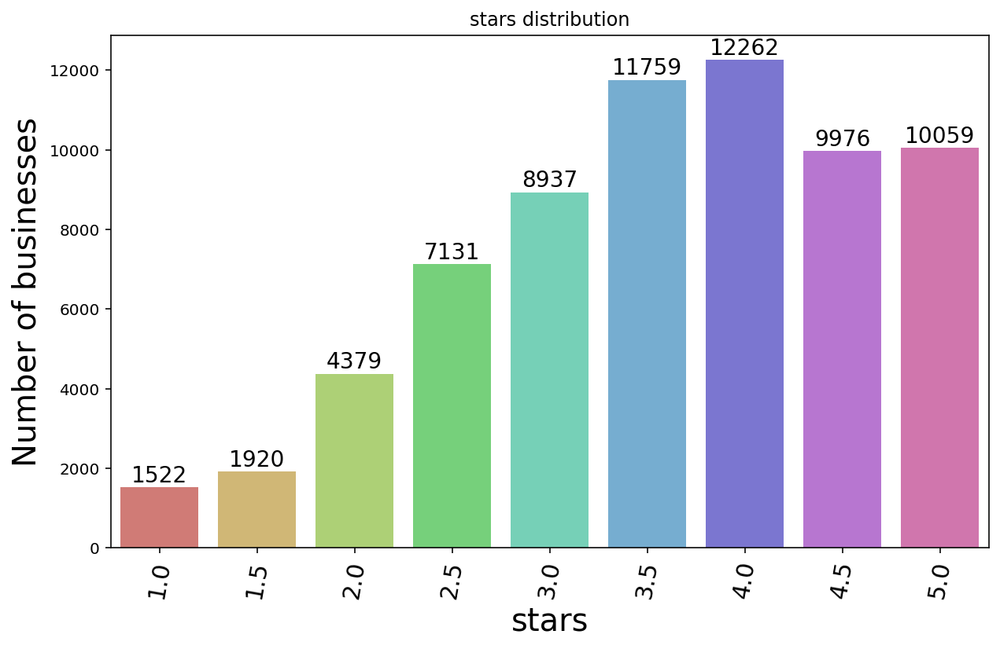

In [7]:
plot_classes_distribution(df, 'stars')

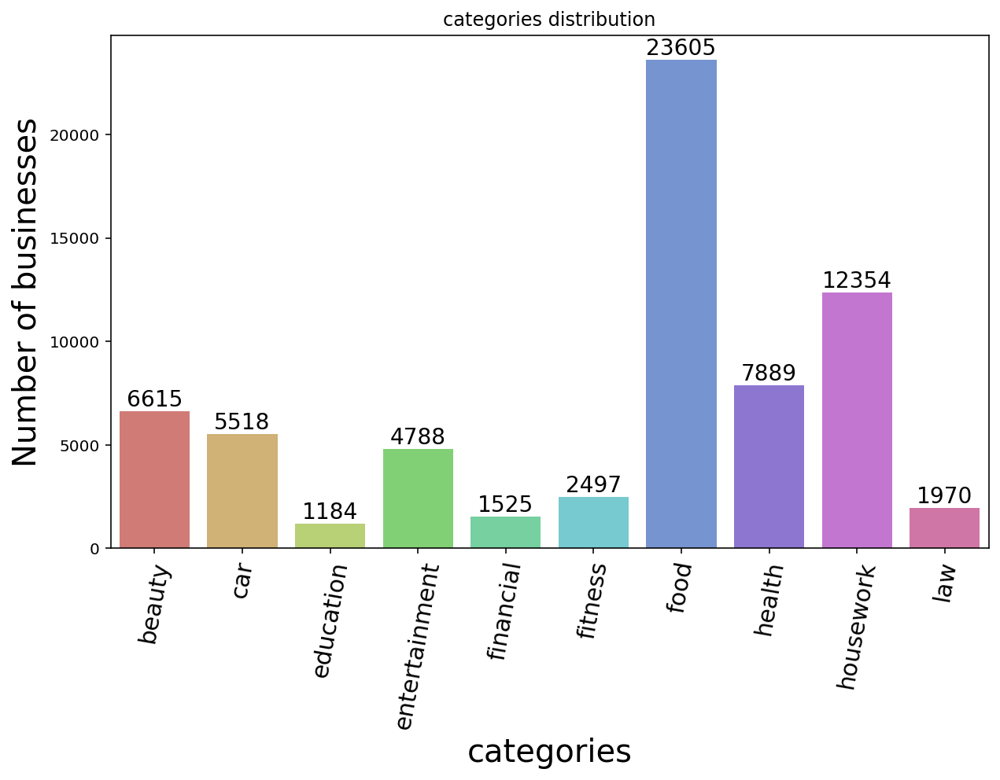

In [8]:
plot_classes_distribution(df, 'categories')

In [13]:
all_corpuses = ' '.join([txt for txt in df['webpage_corpus'] if txt is not np.nan])

In [14]:
wc = WordCloud(width=1600, height=800, random_state=42, max_words=5000).generate(all_corpuses)

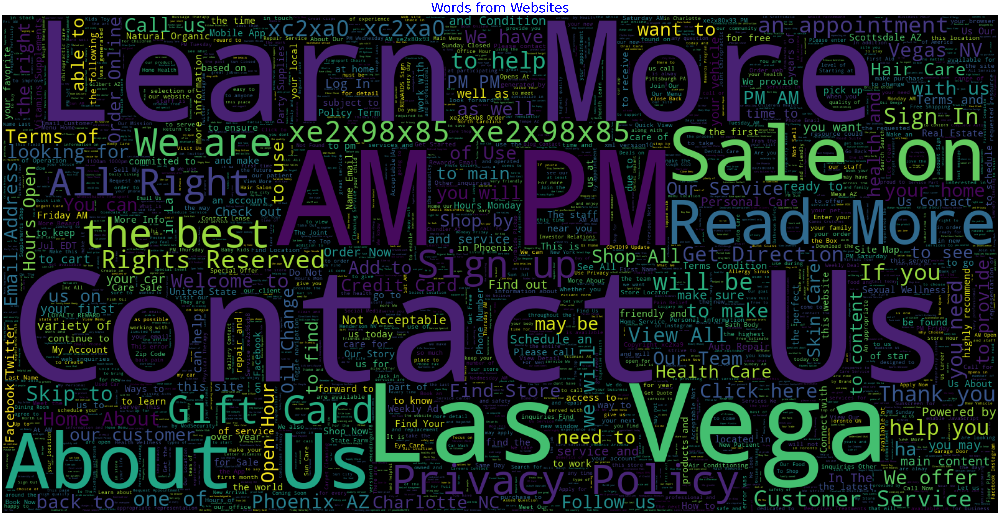

In [15]:
plt.figure(figsize=(45,30))
plt.title("Words from Websites", fontsize=40, color='blue')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
plt.show()

In [ ]:
lon = df['longitude'].values
lat = df['latitude'].values

In [ ]:
import os
os.environ['PROJ_LIB'] = '/home/beginner1010/anaconda3/share/proj'
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

In [ ]:
plt.figure(figsize=(8, 8))
m = Basemap(projection='ortho', resolution=None, lat_0=50, lon_0=-100)
m.bluemarble(scale=0.5)
m.scatter(lon, lat, latlon=True, c='y', s = 10, alpha=0.5)
plt.show()

In [ ]:
count = {}
c = 0
for category, entry in zip(df['categories'], df.iterrows()):
    if category is None: 
        continue
    words = category.split(',')
    for w in words:
        if w not in count: count[w] = 1
        else: count[w] += 1

count.keys()